In [1]:
import os
from skimage.io import imread
from skimage.transform import resize
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
import itertools
from sklearn.metrics import confusion_matrix
import datetime
from time import time

In [2]:
X_train, X_test, y_train, y_test = [], [], [], []

for img in (os.listdir('fingers/train')):
    X_train.append(resize(imread(f'fingers/train/{img}'), (128, 128)))
    y_train.append(img[-6:-4])

for img in (os.listdir('fingers/test')):
    X_test.append(resize(imread(f'fingers/test/{img}'), (128, 128)))
    y_test.append(img[-6:-4])

Liczba rekordów: 21600
Zbiór treningowy: 18000 - 83.33%
Zbiór testowy: 3600 - 16.67%
Rozmiar obrazów: (128, 128)
Etykiety: ['0L', '0R', '1L', '1R', '2L', '2R', '3L', '3R', '4L', '4R', '5L', '5R']


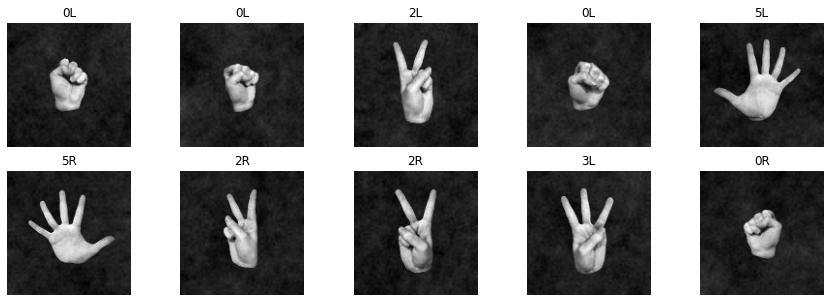

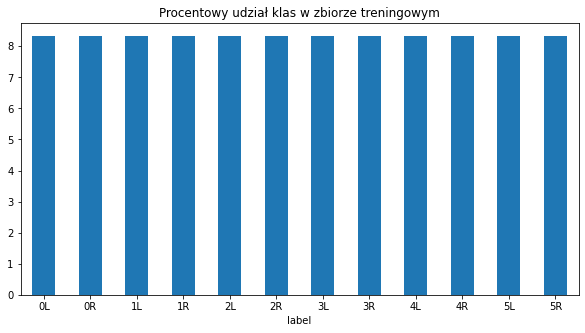

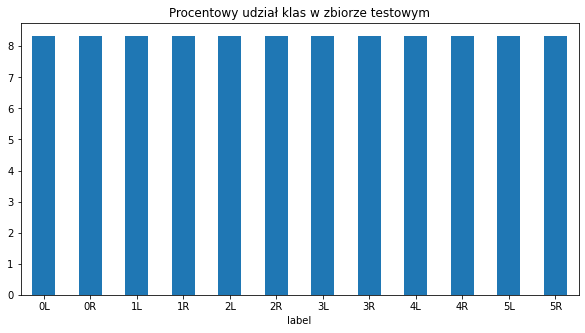

Max: 1.00
Min: 0.02


In [3]:
# Data preprocessing

# Dane
num_of_records = len(X_train) + len(X_test)
labels = sorted(set(y_train + y_test))
print(f'Liczba rekordów: {num_of_records}')
print(f'Zbiór treningowy: {len(X_train)} - {len(X_train) / num_of_records * 100:.2f}%')
print(f'Zbiór testowy: {len(X_test)} - {len(X_test) / num_of_records * 100:.2f}%')
print(f'Rozmiar obrazów: {X_train[0].shape}')
print(f'Etykiety: {labels}')

# Przykładowe obrazy
plt.figure(figsize=(15, 5))
for i in range(10):
    plt.subplot(2, 5, i + 1), plt.imshow(X_train[i], cmap='gray'), plt.title(y_train[i]), plt.axis('off')
plt.show()

# Procentowy udział klas w zbiorze treningowym
df = pd.DataFrame({'label': y_train}).groupby('label', as_index=False).size()
df['size'] = df['size'] / len(y_train) * 100
df.plot(x='label', kind='bar', figsize=(10, 5), title='Procentowy udział klas w zbiorze treningowym', legend=False, rot=0)
plt.show()

# Procentowy udział klas w zbiorze testowym
df = pd.DataFrame({'label': y_test}).groupby('label', as_index=False).size()
df['size'] = df['size'] / len(y_test) * 100
df.plot(x='label', kind='bar', figsize=(10, 5), title='Procentowy udział klas w zbiorze testowym', legend=False, rot=0)
plt.show()

# Normalizacja
max_ = 0.5
min_ = 0.5

for img in X_train:
    if img.max() > max_:
        max_ = img.max()
    if img.min() < min_:
        min_ = img.min()

for img in X_test:
    if img.max() > max_:
        max_ = img.max()
    if img.min() < min_:
        min_ = img.min()

print(f'Max: {max_:.2f}')
print(f'Min: {min_:.2f}')

# LabelEncoder and Numpy Array
le = LabelEncoder()
X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(le.fit_transform(y_train))
y_test = np.array(le.fit_transform(y_test))

In [4]:
# Model

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(128, 128)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(12)
])

model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [5]:
# Trenowanie

tensorboard = tf.keras.callbacks.TensorBoard(log_dir=f'logs/{datetime.datetime.now().strftime("%Y%m%d-%H%M%S")}', histogram_freq=1)

start = time()

history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), callbacks=[tensorboard])

time_nn = time() - start

Epoch 1/10
563/563 [==============================] - 9s 11ms/step - loss: 0.4438 - accuracy: 0.8778 - val_loss: 0.0934 - val_accuracy: 0.9753
Epoch 2/10
563/563 [==============================] - 6s 10ms/step - loss: 0.0695 - accuracy: 0.9803 - val_loss: 0.0216 - val_accuracy: 0.9944
Epoch 3/10
563/563 [==============================] - 5s 8ms/step - loss: 0.0227 - accuracy: 0.9936 - val_loss: 0.0076 - val_accuracy: 0.9983
Epoch 4/10
563/563 [==============================] - 5s 9ms/step - loss: 0.0184 - accuracy: 0.9948 - val_loss: 0.0045 - val_accuracy: 0.9986
Epoch 5/10
563/563 [==============================] - 5s 9ms/step - loss: 0.0538 - accuracy: 0.9836 - val_loss: 0.0084 - val_accuracy: 0.9967
Epoch 6/10
563/563 [==============================] - 5s 8ms/step - loss: 0.0089 - accuracy: 0.9973 - val_loss: 0.0311 - val_accuracy: 0.9897
Epoch 7/10
563/563 [==============================] - 5s 8ms/step - loss: 0.0366 - accuracy: 0.9897 - val_loss: 0.0055 - val_accuracy: 0.9978
Epoc

In [6]:
# Plot Confusion Matrix

def plot_confusion_matrix(cm, class_names, normalize):
    figure = plt.figure(figsize=(8, 8))
    plt.imshow(cm, interpolation='nearest', cmap='Blues')
    plt.title("Confusion matrix")
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names)
    plt.yticks(tick_marks, class_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

563/563 [==============================] - 5s 8ms/step - loss: 6.1316e-04 - accuracy: 0.9999
Train accuracy: 0.9999444484710693


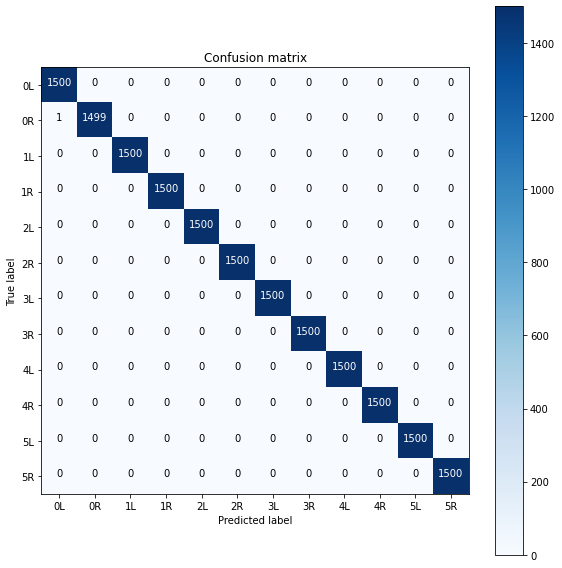

In [7]:
# Ewaluacja - Zbiór treningowy

train_loss, train_acc = model.evaluate(X_train,  y_train)
print(f'Train accuracy: {train_acc}')

probability_model = tf.keras.Sequential([model, tf.keras.layers.Softmax()])

y_pred = probability_model.predict(X_train)

cm = confusion_matrix(y_train, np.argmax(y_pred, axis=1))
plot_confusion_matrix(cm, class_names=labels, normalize=False)

113/113 [==============================] - 1s 7ms/step - loss: 0.0016 - accuracy: 0.9997
Test accuracy: 0.9997222423553467


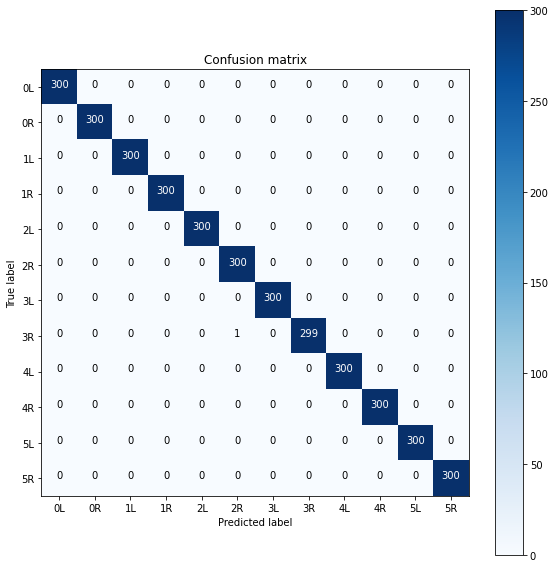

In [8]:
# Ewaluacja - Zbiór testowy

test_loss, test_acc = model.evaluate(X_test,  y_test)
print(f'Test accuracy: {test_acc}')

y_pred = probability_model.predict(X_test)

cm = confusion_matrix(y_test, np.argmax(y_pred, axis=1))
plot_confusion_matrix(cm, class_names=labels, normalize=False)

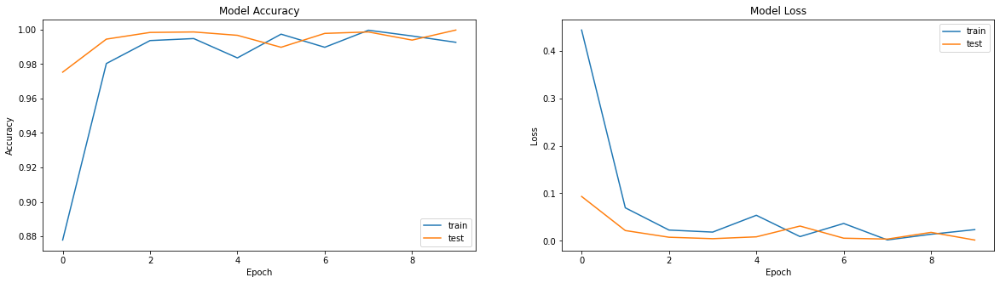

In [9]:
# Ocena modelu

# Accuracy and Loss
plt.figure(figsize=(20, 5))
plt.subplot(121)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc='best')
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc='best')
plt.show()

In [10]:
# Plot Image

def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i], img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  plt.imshow(img, cmap='gray')

  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("{} {:2.0f}% ({})".format(labels[predicted_label], 100*np.max(predictions_array), labels[true_label]), color=color)

# Plot Value Array

def plot_value_array(i, predictions_array, true_label):
  true_label = true_label[i]
  plt.grid(False)
  plt.xticks(range(12))
  plt.yticks([])
  thisplot = plt.bar(range(12), predictions_array, color="#777777")
  plt.ylim([0, 1])
  predicted_label = np.argmax(predictions_array)

  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('blue')

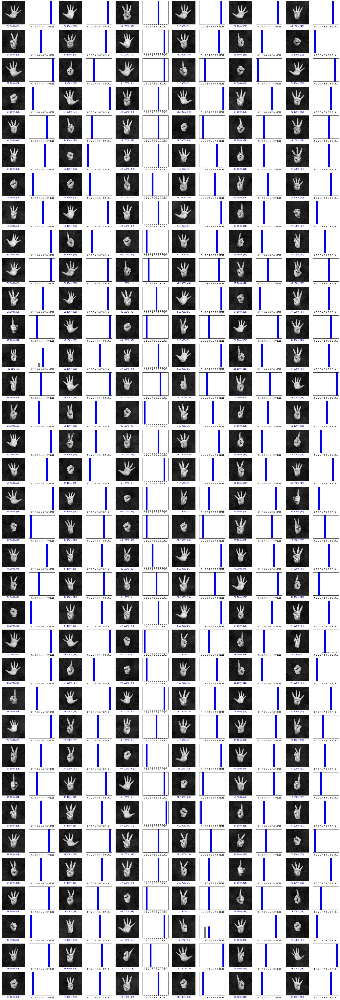

In [11]:
# Analiza wyników

num_rows = 35
num_cols = 6
num_images = num_rows*num_cols
plt.figure(figsize=(2*2*num_cols, 2*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_image(i, y_pred[i], y_test, X_test)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_value_array(i, y_pred[i], y_test)
plt.tight_layout()
plt.show()

In [12]:
# TensorBoard

# %load_ext tensorboard
# %tensorboard --logdir logs

# from tensorboard import notebook
# notebook.list()

# python -m tensorboard.main --logdir=logs

Funkcje aktywacji:

Sigmoid


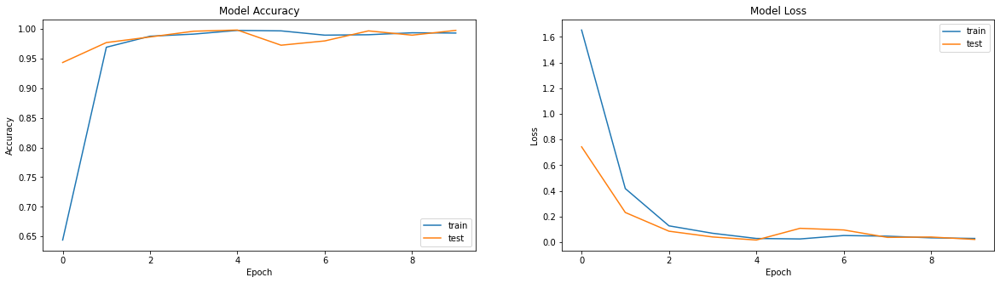

Tanh


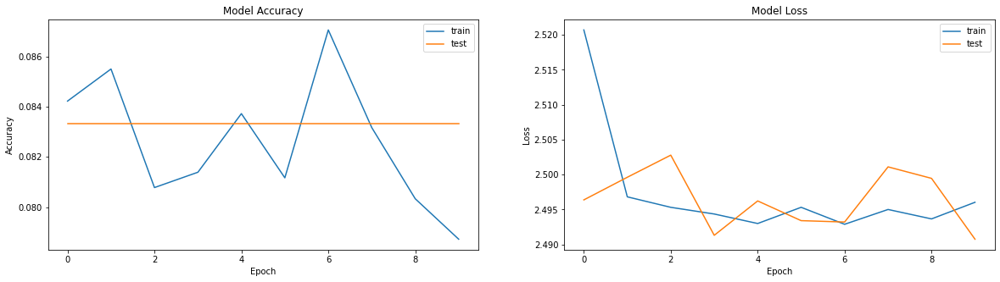

In [13]:
# Strojenie parametrów sieci

# Funkcje aktywacji
print('Funkcje aktywacji:\n')

# Sigmoid
print('Sigmoid')

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(128, 128)),
    tf.keras.layers.Dense(128, activation='sigmoid'),
    tf.keras.layers.Dense(64, activation='sigmoid'),
    tf.keras.layers.Dense(12)
])

model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), verbose=0)

# Accuracy and Loss
plt.figure(figsize=(20, 5))
plt.subplot(121)
plt.plot(history.history['accuracy']), plt.plot(history.history['val_accuracy']), plt.title('Model Accuracy'), plt.ylabel('Accuracy'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.subplot(122)
plt.plot(history.history['loss']), plt.plot(history.history['val_loss']), plt.title('Model Loss'), plt.ylabel('Loss'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.show()

# Tanh
print('Tanh')

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(128, 128)),
    tf.keras.layers.Dense(128, activation='tanh'),
    tf.keras.layers.Dense(64, activation='tanh'),
    tf.keras.layers.Dense(12)
])

model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), verbose=0)

# Accuracy and Loss
plt.figure(figsize=(20, 5))
plt.subplot(121)
plt.plot(history.history['accuracy']), plt.plot(history.history['val_accuracy']), plt.title('Model Accuracy'), plt.ylabel('Accuracy'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.subplot(122)
plt.plot(history.history['loss']), plt.plot(history.history['val_loss']), plt.title('Model Loss'), plt.ylabel('Loss'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.show()

Liczba epok:

20


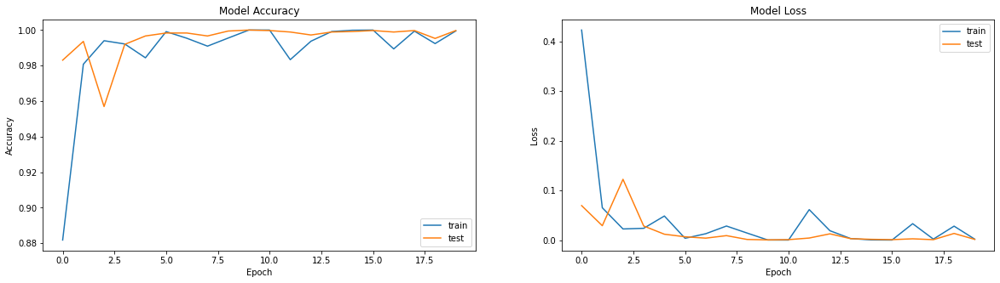

5


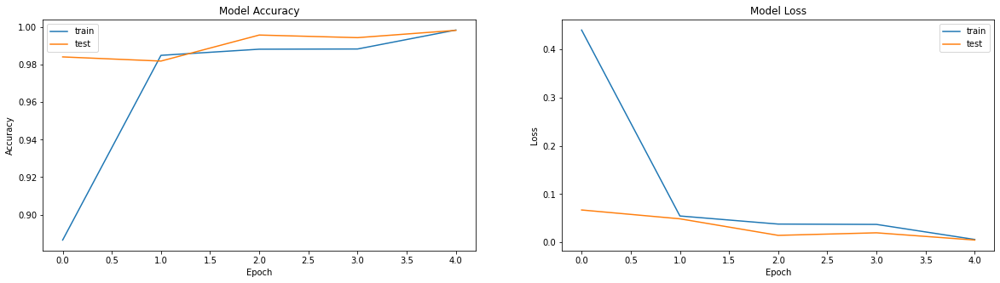

In [14]:
# Liczba epok
print('Liczba epok:\n')

# 20
print('20')

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(128, 128)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(12)
])

model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=20, validation_data=(X_test, y_test), verbose=0)

# Accuracy and Loss
plt.figure(figsize=(20, 5))
plt.subplot(121)
plt.plot(history.history['accuracy']), plt.plot(history.history['val_accuracy']), plt.title('Model Accuracy'), plt.ylabel('Accuracy'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.subplot(122)
plt.plot(history.history['loss']), plt.plot(history.history['val_loss']), plt.title('Model Loss'), plt.ylabel('Loss'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.show()

# 5
print('5')

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(128, 128)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(12)
])

model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=5, validation_data=(X_test, y_test), verbose=0)

# Accuracy and Loss
plt.figure(figsize=(20, 5))
plt.subplot(121)
plt.plot(history.history['accuracy']), plt.plot(history.history['val_accuracy']), plt.title('Model Accuracy'), plt.ylabel('Accuracy'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.subplot(122)
plt.plot(history.history['loss']), plt.plot(history.history['val_loss']), plt.title('Model Loss'), plt.ylabel('Loss'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.show()

Liczba neuronów warstw ukrytych:

64, 32


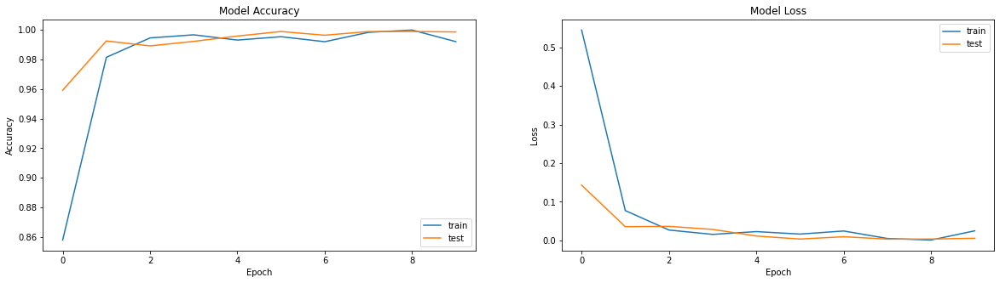

256, 128


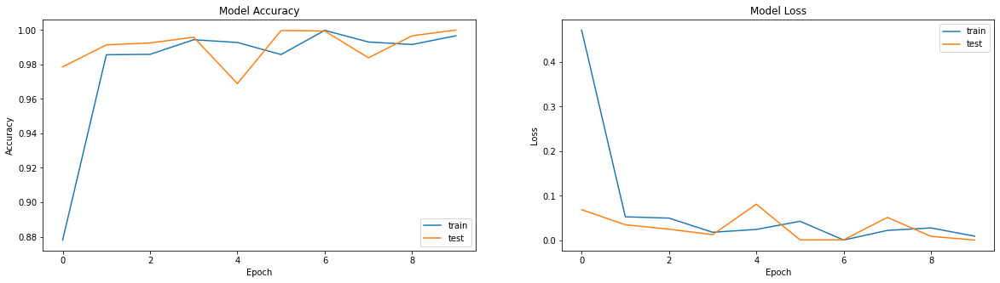

In [15]:
# Liczba neuronów warstw ukrytych
print('Liczba neuronów warstw ukrytych:\n')

# 64, 32
print('64, 32')

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(128, 128)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(12)
])

model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), verbose=0)

# Accuracy and Loss
plt.figure(figsize=(20, 5))
plt.subplot(121)
plt.plot(history.history['accuracy']), plt.plot(history.history['val_accuracy']), plt.title('Model Accuracy'), plt.ylabel('Accuracy'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.subplot(122)
plt.plot(history.history['loss']), plt.plot(history.history['val_loss']), plt.title('Model Loss'), plt.ylabel('Loss'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.show()

# 256, 128
print('256, 128')

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(128, 128)),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(12)
])

model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), verbose=0)

# Accuracy and Loss
plt.figure(figsize=(20, 5))
plt.subplot(121)
plt.plot(history.history['accuracy']), plt.plot(history.history['val_accuracy']), plt.title('Model Accuracy'), plt.ylabel('Accuracy'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.subplot(122)
plt.plot(history.history['loss']), plt.plot(history.history['val_loss']), plt.title('Model Loss'), plt.ylabel('Loss'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.show()

Dwie dodatkowe warstwy ukryte:



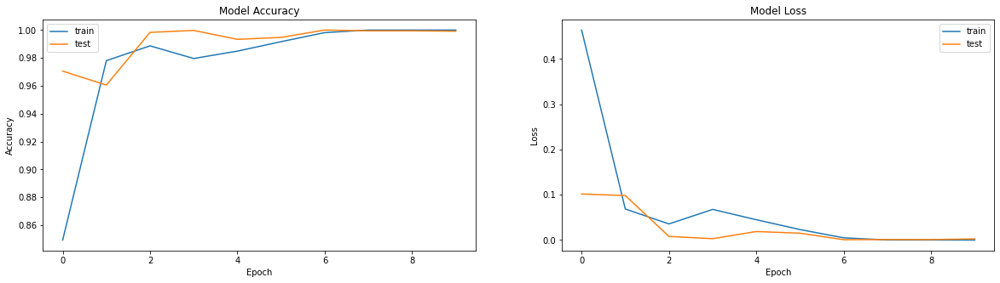

In [16]:
# Dwie dodatkowe warstwy ukryte
print('Dwie dodatkowe warstwy ukryte:\n')

model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(128, 128)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(12)
])

model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), verbose=0)

# Accuracy and Loss
plt.figure(figsize=(20, 5))
plt.subplot(121)
plt.plot(history.history['accuracy']), plt.plot(history.history['val_accuracy']), plt.title('Model Accuracy'), plt.ylabel('Accuracy'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.subplot(122)
plt.plot(history.history['loss']), plt.plot(history.history['val_loss']), plt.title('Model Loss'), plt.ylabel('Loss'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.show()

In [17]:
# Konwolucyjne sieci neuronowe

model = tf.keras.Sequential([
    tf.keras.layers.Reshape((128, 128, 1), input_shape=(128, 128)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(12)
])


model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

start = time()

history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

time_cnn = time() - start

Epoch 1/10
563/563 [==============================] - 19s 23ms/step - loss: 0.1638 - accuracy: 0.9478 - val_loss: 7.7207e-04 - val_accuracy: 0.9997
Epoch 2/10
563/563 [==============================] - 13s 23ms/step - loss: 5.5872e-05 - accuracy: 1.0000 - val_loss: 8.5683e-05 - val_accuracy: 1.0000
Epoch 3/10
563/563 [==============================] - 13s 22ms/step - loss: 1.1164e-05 - accuracy: 1.0000 - val_loss: 7.0065e-05 - val_accuracy: 1.0000
Epoch 4/10
563/563 [==============================] - 13s 22ms/step - loss: 5.8985e-06 - accuracy: 1.0000 - val_loss: 1.2232e-04 - val_accuracy: 1.0000
Epoch 5/10
563/563 [==============================] - 13s 23ms/step - loss: 4.2656e-06 - accuracy: 1.0000 - val_loss: 7.9540e-05 - val_accuracy: 1.0000
Epoch 6/10
563/563 [==============================] - 13s 23ms/step - loss: 2.6385e-06 - accuracy: 1.0000 - val_loss: 9.7343e-05 - val_accuracy: 1.0000
Epoch 7/10
563/563 [==============================] - 13s 22ms/step - loss: 1.9499e-06 - acc

In [18]:
# Porównanie czasu

print(f'Czas uczenia sieci bez warstw konwolucyjnych: {time_nn:.2f}')
print(f'Czas uczenia sieci z warstwami konwolucyjnymi: {time_cnn:.2f}')

Czas uczenia sieci bez warstw konwolucyjnych: 54.74
Czas uczenia sieci z warstwami konwolucyjnymi: 133.01


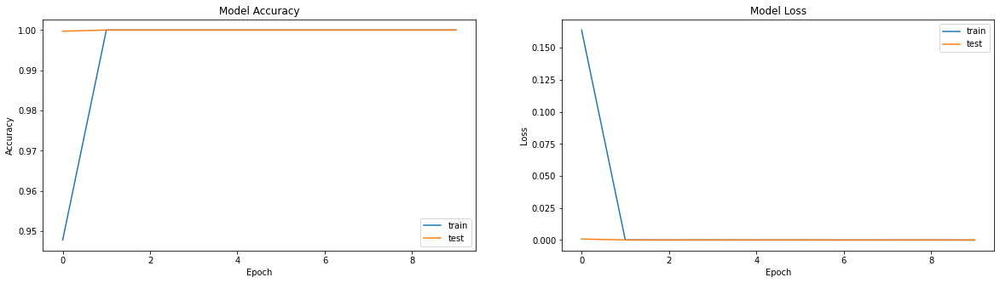

In [19]:
# Accuracy and Loss
plt.figure(figsize=(20, 5))
plt.subplot(121)
plt.plot(history.history['accuracy']), plt.plot(history.history['val_accuracy']), plt.title('Model Accuracy'), plt.ylabel('Accuracy'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.subplot(122)
plt.plot(history.history['loss']), plt.plot(history.history['val_loss']), plt.title('Model Loss'), plt.ylabel('Loss'), plt.xlabel('Epoch'), plt.legend(['train', 'test'], loc='best')
plt.show()

563/563 [==============================] - 6s 11ms/step - loss: 5.6902e-07 - accuracy: 1.0000
Train accuracy: 1.0


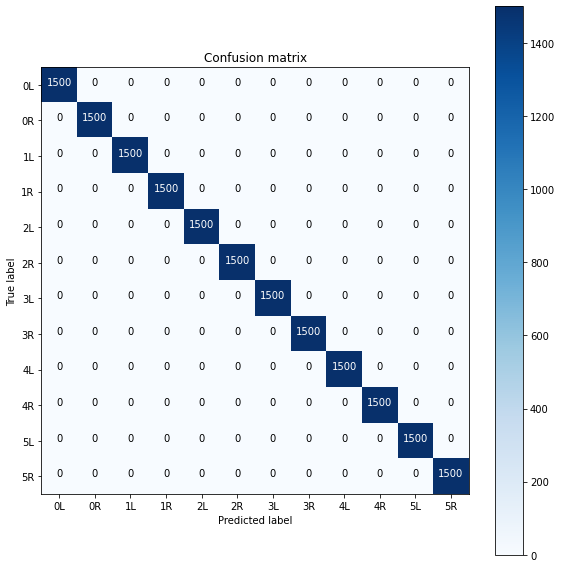

In [20]:
# Ewaluacja - Zbiór treningowy

train_loss, train_acc = model.evaluate(X_train,  y_train)
print(f'Train accuracy: {train_acc}')

probability_model = tf.keras.Sequential([model, tf.keras.layers.Softmax()])

y_pred = probability_model.predict(X_train)

cm = confusion_matrix(y_train, np.argmax(y_pred, axis=1))
plot_confusion_matrix(cm, class_names=labels, normalize=False)

113/113 [==============================] - 1s 11ms/step - loss: 3.1275e-05 - accuracy: 1.0000
Test accuracy: 1.0


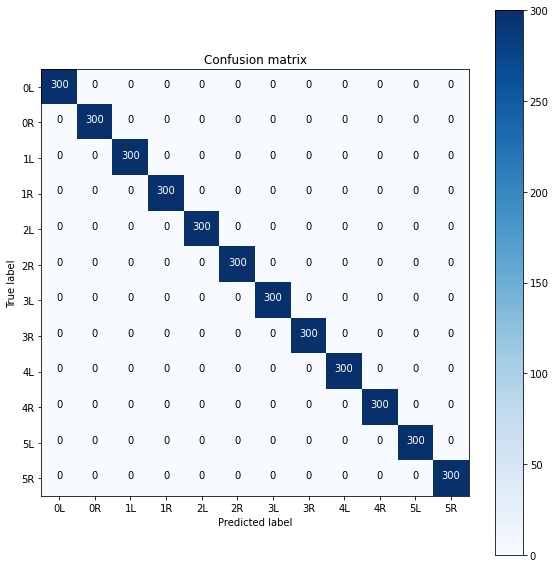

In [21]:
# Ewaluacja - Zbiór testowy

test_loss, test_acc = model.evaluate(X_test,  y_test)
print(f'Test accuracy: {test_acc}')

y_pred = probability_model.predict(X_test)

cm = confusion_matrix(y_test, np.argmax(y_pred, axis=1))
plot_confusion_matrix(cm, class_names=labels, normalize=False)